Benchmark of DLPFC dataset

In [1]:
import os,sys
sys.path.append(os.path.realpath(os.path.join(os.getcwd(), '..')))
import warnings
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from MuCoSTX.config import config
opt = config()
args = opt.parse_args(['--gpu', '0'])
args.dataset_path = '/mnt/d/Dataset/SRT_Dataset/1-DLPFC/'
args.cluster = 7
if args.version.split('-')[0] != 'dev':
    warnings.filterwarnings("ignore")
args

Namespace(amp=True, batch_size=512, cluster=7, clusters=0, dataset_path='/mnt/d/Dataset/SRT_Dataset/1-DLPFC/', dropout=0.3, flow='source_to_target', gpu=0, hvgs=3000, latent_dim=64, log_file='../Log', log_steps=20, lr=0.001, max_epoch=100, max_neighbors=6, mode_rknn='rknn', n_spot=0, out_file='../Output', project_name='MoCoSTX', seed=2024, srt_resolution=150, tau=0.05, version='dev-1.0', visual=True, wegiht_decay=0.0001)

In [3]:
from MuCoSTX.utils import set_random_seed
set_random_seed(args.seed)

In [4]:
sections = ['151507', '151508', '151509', '151510','151669', '151670', '151671', '151672', '151673', '151674', '151675', '151676']

In [5]:
adata_list = []
for section in sections:
    adata = sc.read_visium(os.path.join(args.dataset_path+section))
    adata.var_names_make_unique()
    sc.pp.filter_genes(adata, min_cells=10)
    # sc.pp.filter_cells(adata, min_genes=200)
    # sc.pp.highly_variable_genes(adata, flavor="seurat_v3", n_top_genes=10000)
    # adata = adata[:, adata.var['highly_variable']]
    Ann_df = pd.read_csv(os.path.join(args.dataset_path+'1-DLPFC_annotations/', section+'_truth.txt'), sep='\t', header=None, index_col=0)
    Ann_df.columns = ['Ground Truth']
    adata.obs['Ground Truth'] = Ann_df.loc[adata.obs_names, 'Ground Truth']
    adata_list.append(adata)

/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are n

In [6]:
from  MuCoSTX.mucostx import MuCoSTX
mx = MuCoSTX(adata_list, args)

/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/preprocess

Data(x=[47632, 3001], edge_index=[2, 277466]) Data(x=[47632, 3001], edge_index=[2, 1468266], edge_attr=[1468266])


  0%|          | 0/100 [00:00<?, ?it/s]

x dim 504, running loss: 809.2544665336609
x dim 501, running loss: 652.5504307746887
x dim 484, running loss: 580.6305975914001
x dim 496, running loss: 520.8178334236145
x dim 501, running loss: 470.01442098617554
x dim 500, running loss: 425.3135380744934
x dim 485, running loss: 386.0846447944641
x dim 490, running loss: 351.88522148132324
x dim 501, running loss: 322.3335258960724
x dim 500, running loss: 296.3301920890808
x dim 505, running loss: 273.15474939346313
x dim 496, running loss: 252.89933443069458
x dim 506, running loss: 235.37517642974854
x dim 496, running loss: 219.8420422077179
x dim 504, running loss: 206.03117382526398
x dim 497, running loss: 194.29851520061493
x dim 503, running loss: 184.04559755325317
x dim 506, running loss: 174.8384313583374
x dim 498, running loss: 166.9341266155243
x dim 504, running loss: 159.94586563110352
x dim 496, running loss: 153.66983366012573
x dim 502, running loss: 148.32963001728058
x dim 500, running loss: 143.43533980846405

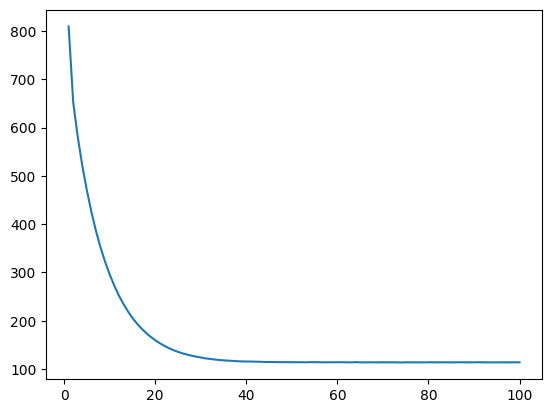

In [7]:
mx.train_emb()

Downstream workflow

In [8]:
list_new = mx.get_adata_all()
list_new

[AnnData object with n_obs × n_vars = 4218 × 3000
     obs: 'in_tissue', 'array_row', 'array_col', 'Ground Truth', 'n_genes'
     var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mean', 'std'
     uns: 'spatial', 'log1p'
     obsm: 'spatial', 'mx',
 AnnData object with n_obs × n_vars = 4378 × 3000
     obs: 'in_tissue', 'array_row', 'array_col', 'Ground Truth', 'n_genes'
     var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mean', 'std'
     uns: 'spatial', 'log1p'
     obsm: 'spatial', 'mx',
 AnnData object with n_obs × n_vars = 4784 × 3000
     obs: 'in_tissue', 'array_row', 'array_col', 'Ground Truth', 'n_genes'
     var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mean', 'std'
     uns: 'spatial', 'log1p'
     obsm: 'spatial', 'mx',
 AnnData object with n_obs × n_vars = 4626 × 3000
     obs: 'in_tissue', 'array_row', 'array_col', 'Ground Truth', 'n_genes'
     var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mean', 'std'
     uns: 'spatial', 'log1p'
    

In [9]:
# save_dir = args.dataset_path+'adata_all/'
# os.makedirs(save_dir, exist_ok=True)

   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 6.1.1
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


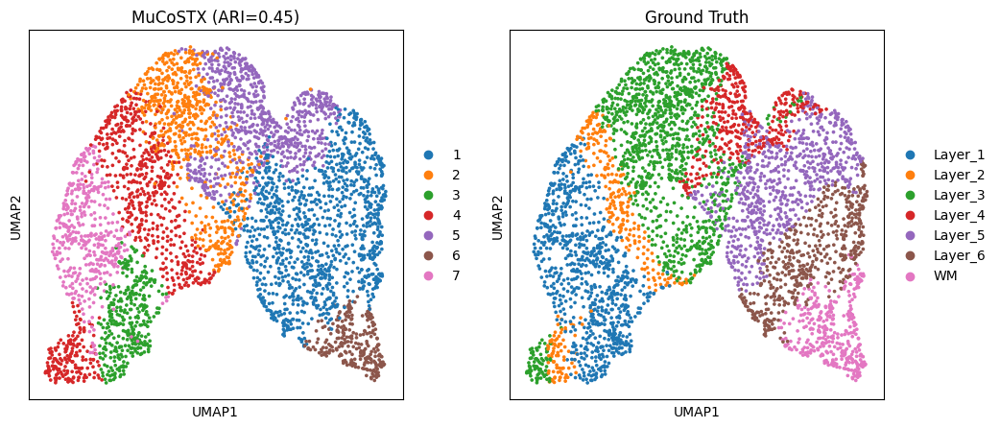

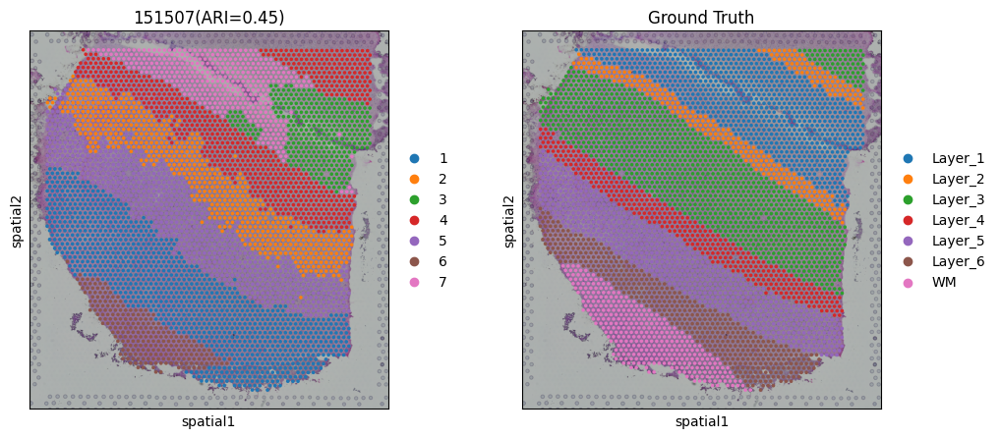

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


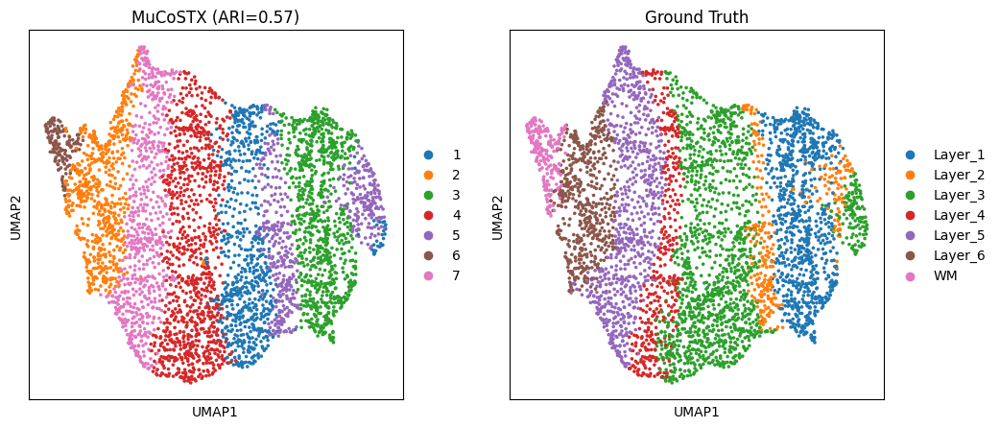

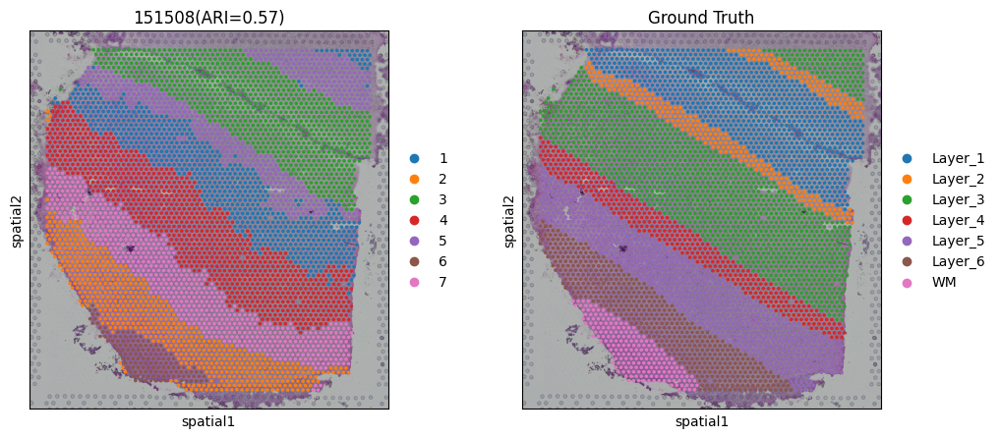

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


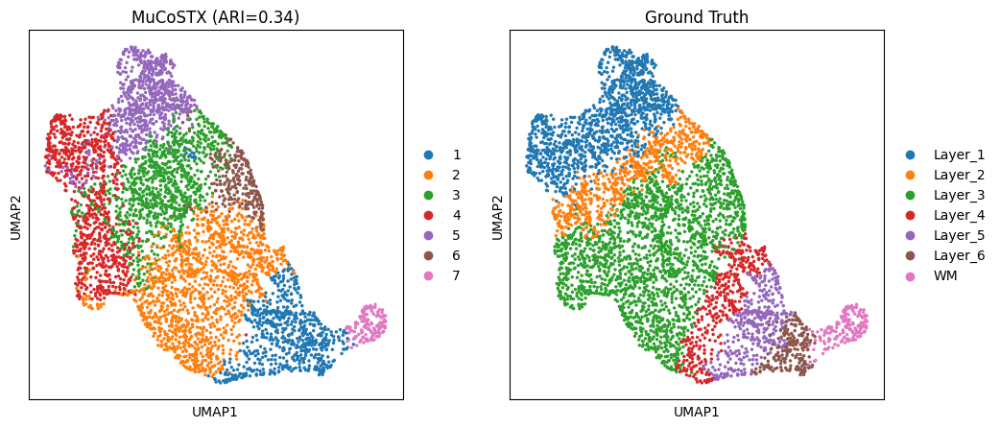

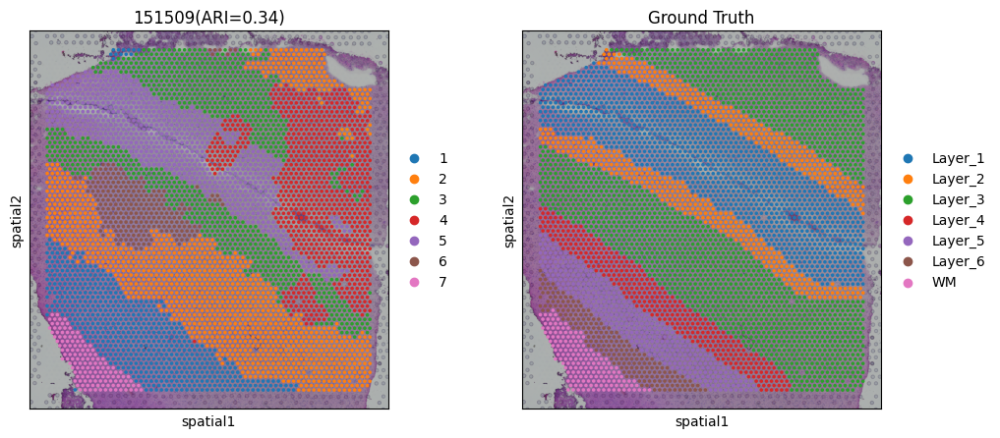

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


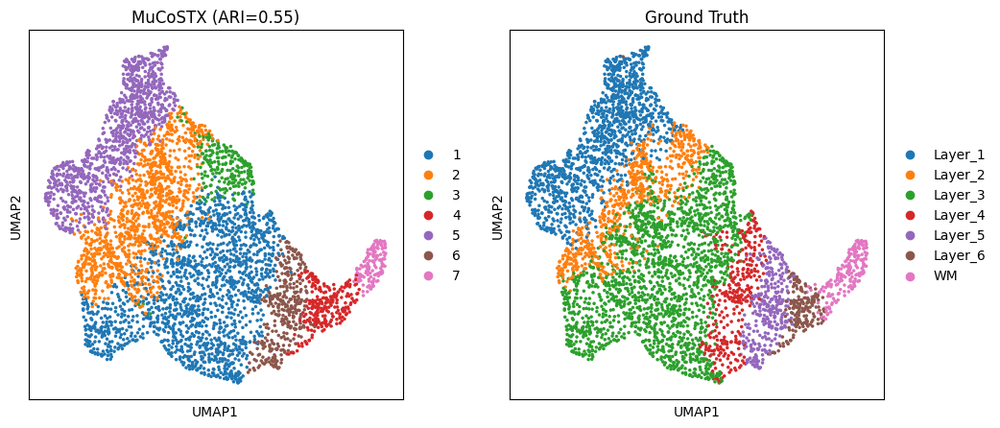

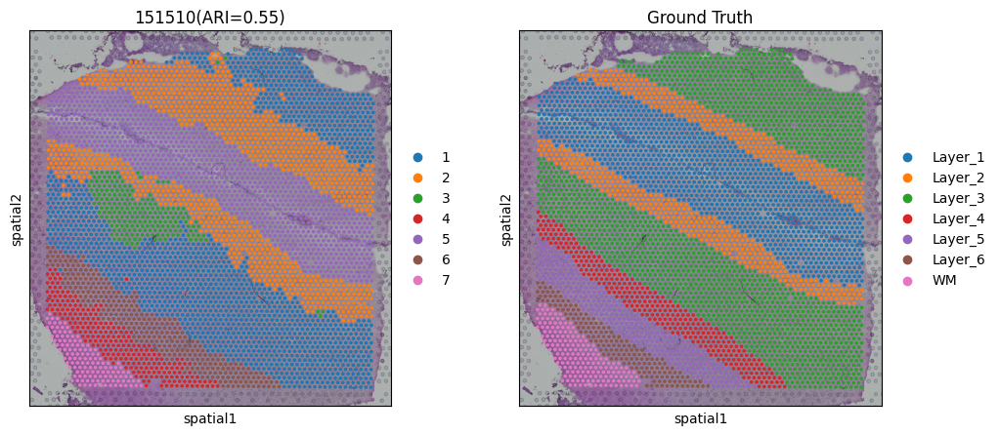

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


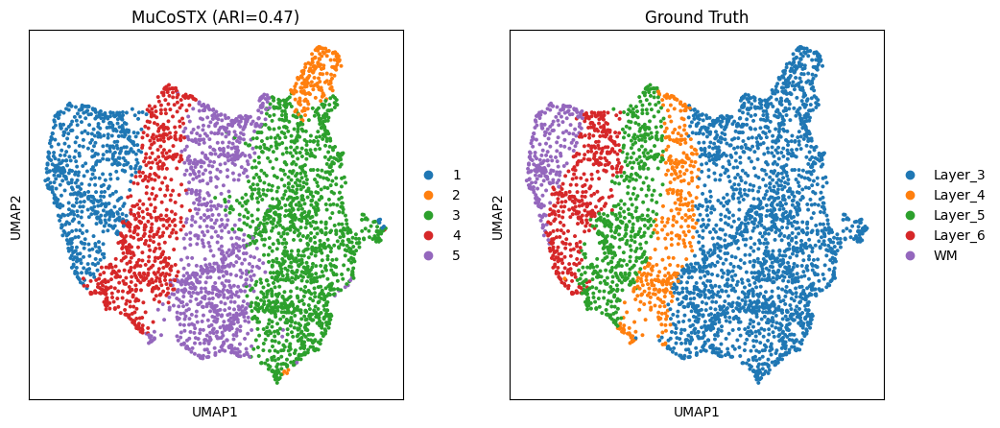

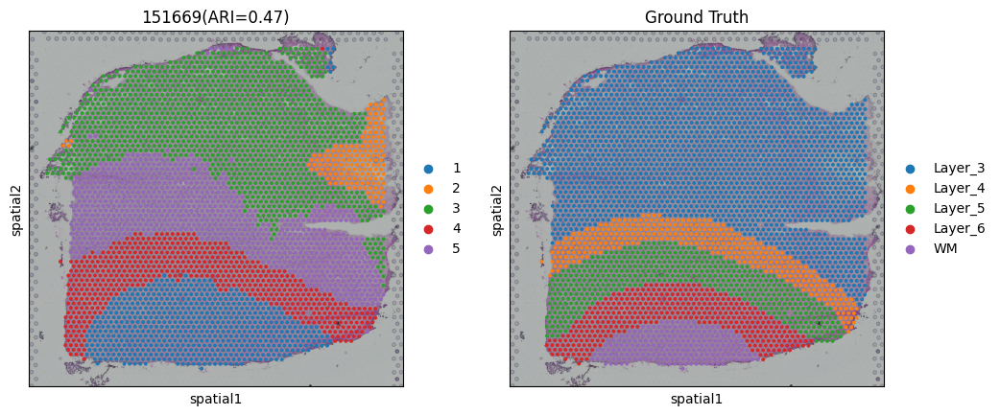

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


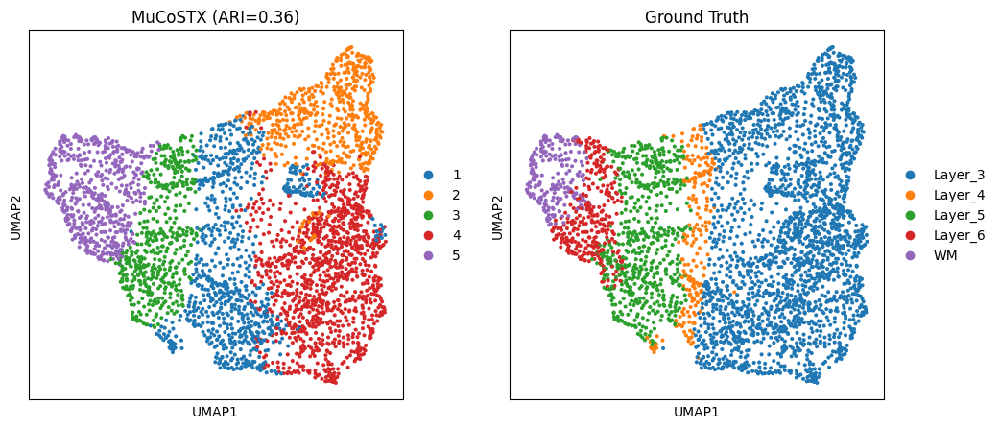

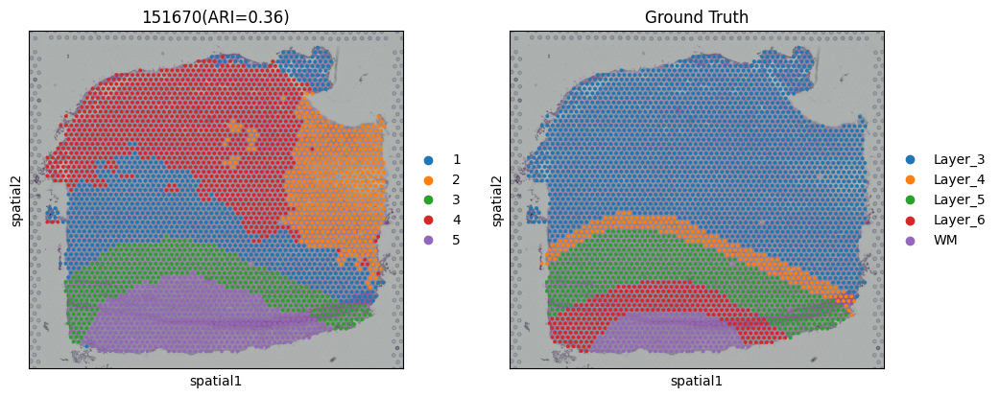

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


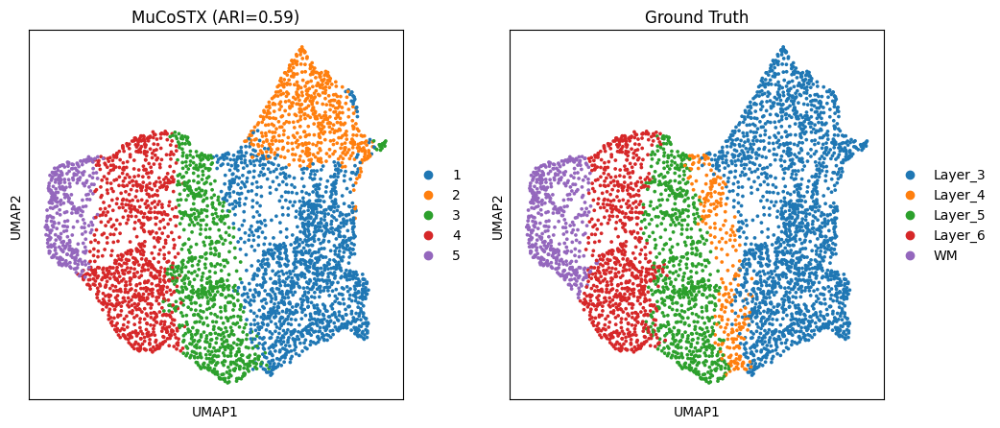

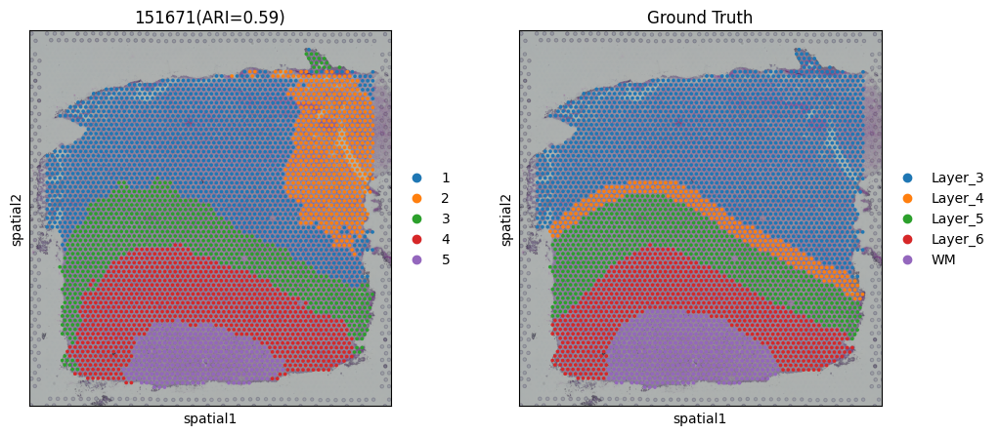

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


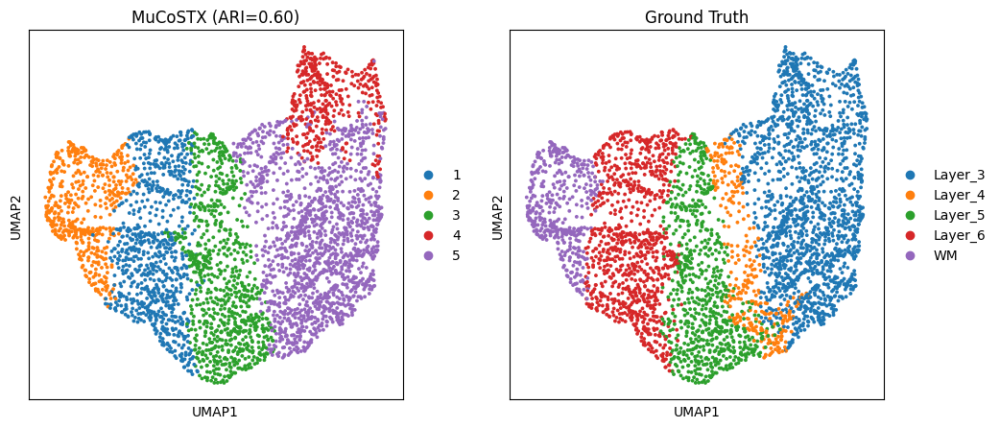

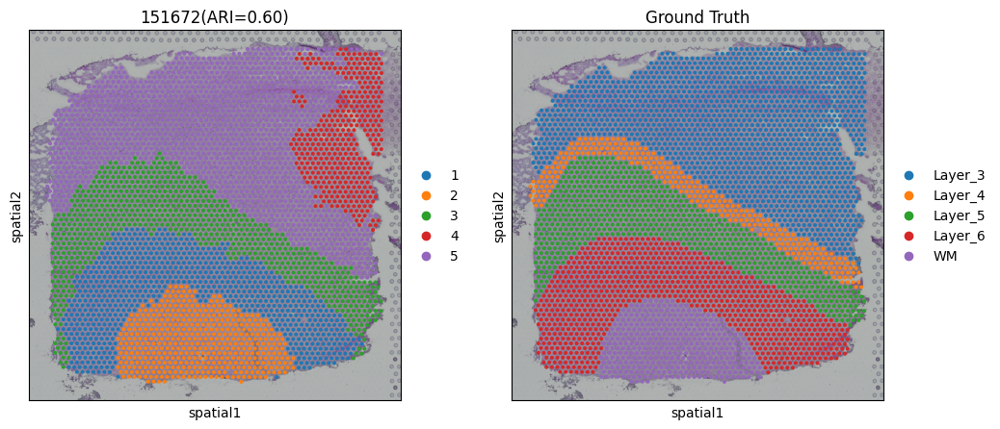

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


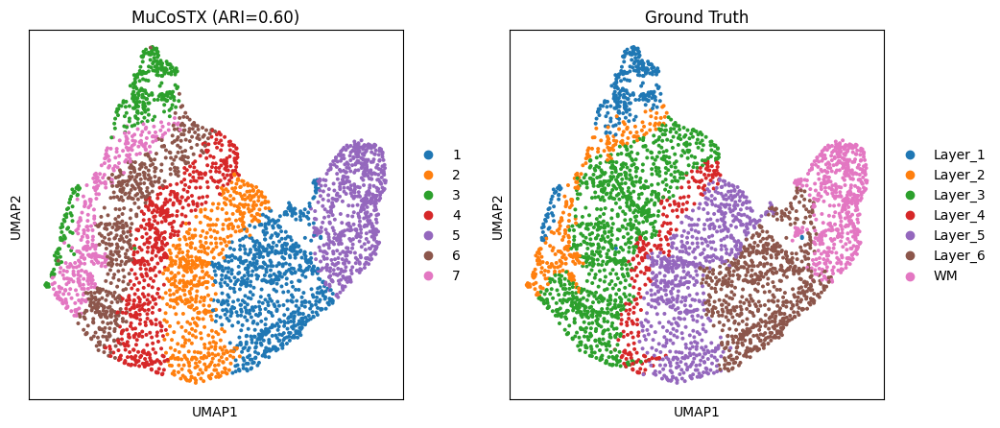

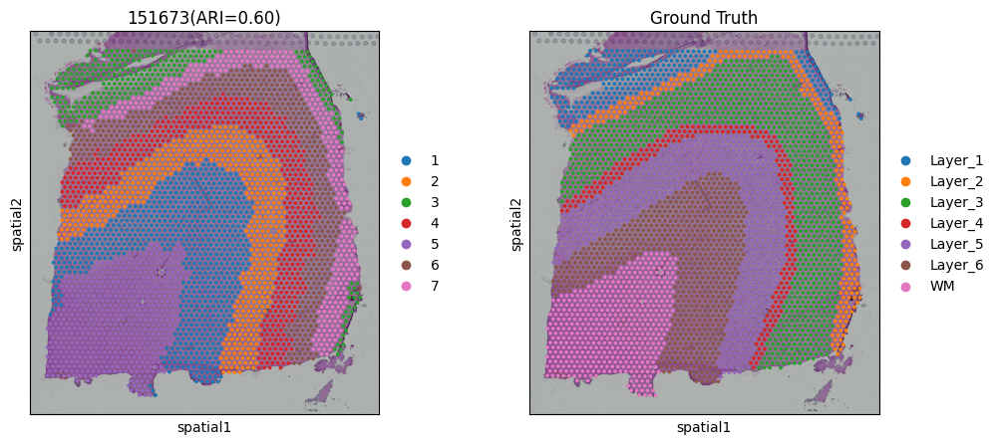

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


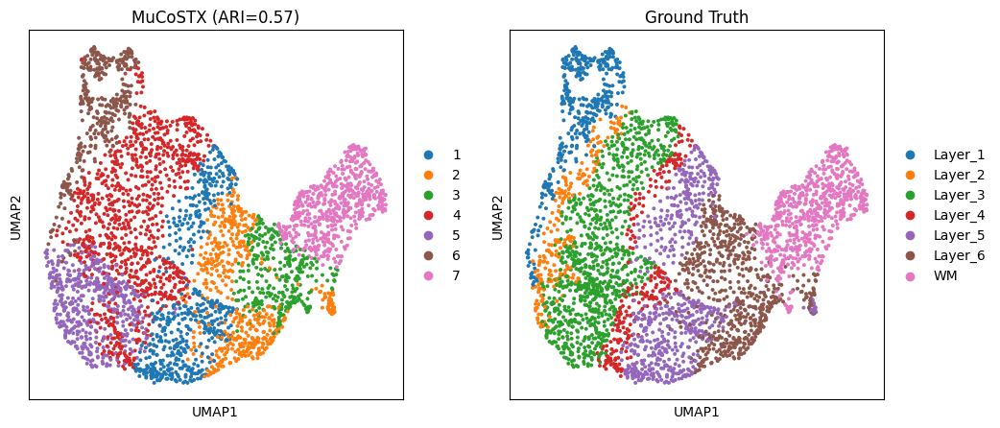

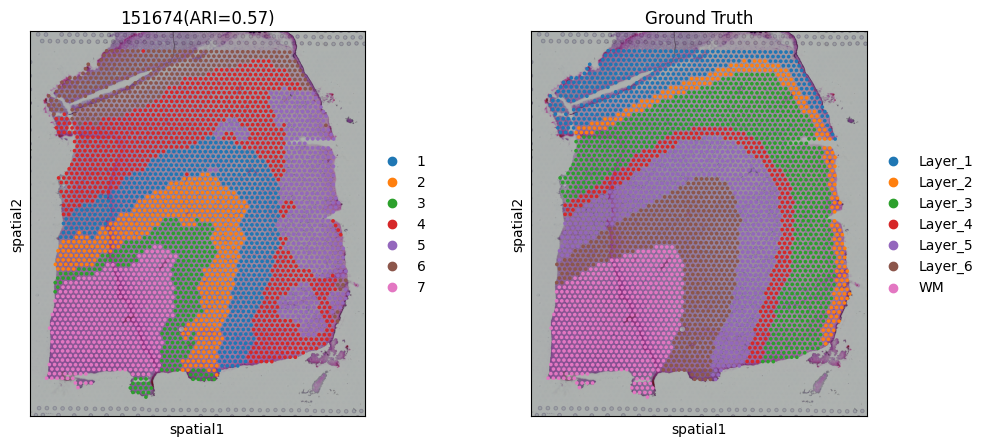

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


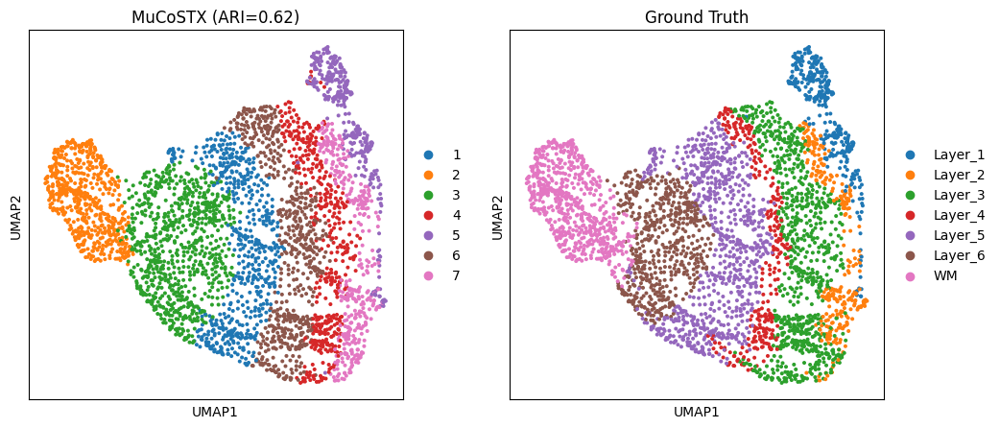

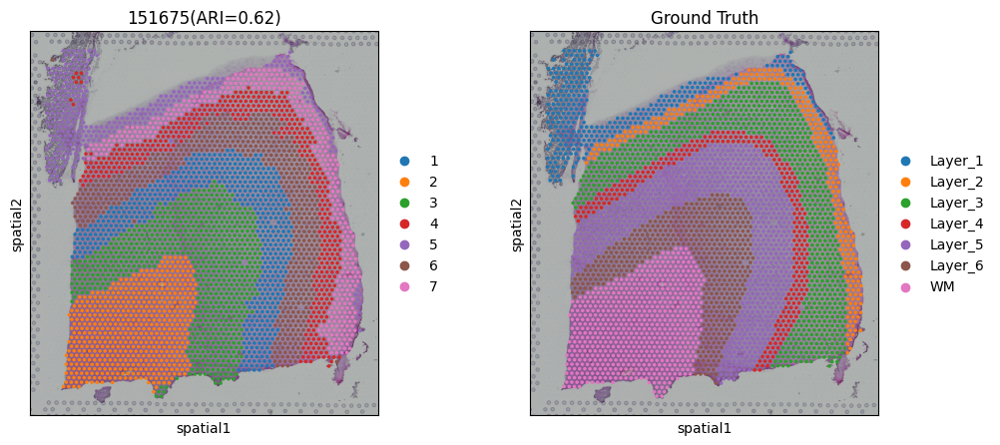

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


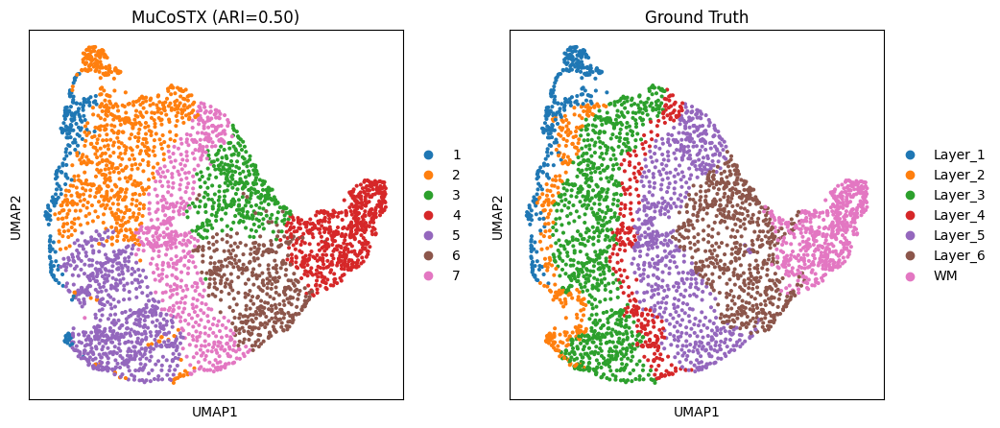

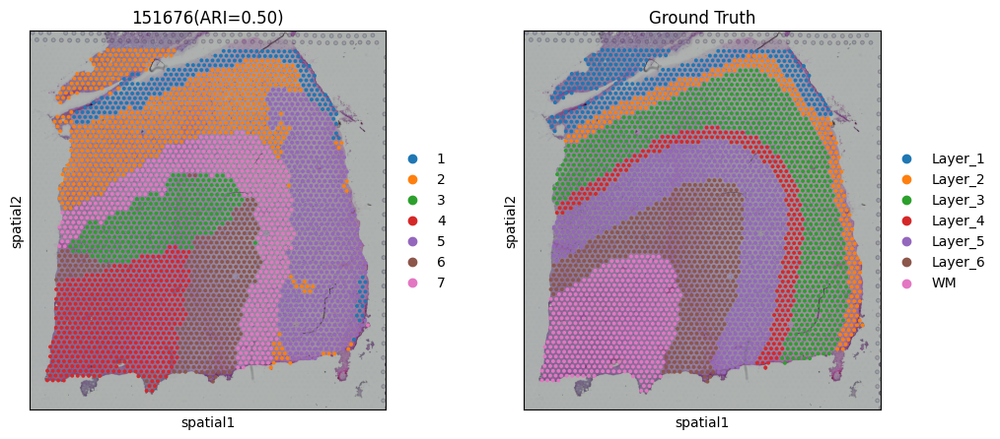

In [10]:
ari = []
from sklearn.metrics import adjusted_rand_score
from MuCoSTX.utils import mclust
n_d = [7,7,7,7,5,5,5,5,7,7,7,7]
for i in range(12):
    adata_i = list_new[i]
    args.n_domain=n_d[i]
    adata_i = mclust(adata_i, args, refine=False, use='mx')
    adata_i = adata_i[~pd.isnull(adata_i.obs['Ground Truth'])]
    obs_df = adata_i.obs.dropna()
    ARI = adjusted_rand_score(obs_df['mclust'], obs_df['Ground Truth'])
    ari.append(ARI)
    sc.pp.neighbors(adata_i, use_rep='mx')
    sc.tl.umap(adata_i)
    plt.rcParams["figure.figsize"] = (5, 5)
    sc.pl.umap(adata_i, color=["mclust", "Ground Truth"], title=['MuCoSTX (ARI=%.2f)'%ARI, "Ground Truth"])
    sc.pl.spatial(adata_i,color=["mclust", "Ground Truth"], title=sections[i]+'(ARI=%.2f)'%ARI)

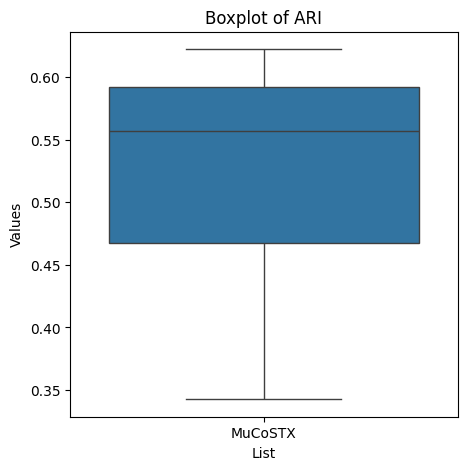

In [12]:
import seaborn as sns
import pandas as pd

# 示例数据：多个列表
data = {
    "MuCoSTX": ari,
}

# 转换为 DataFrame
df = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in data.items()]))

# 转换为长格式
df_melted = df.melt(var_name="List", value_name="Values")

# 绘制箱线图
sns.boxplot(x="List", y="Values", data=df_melted)

# 添加标题
plt.title("Boxplot of ARI")

# 显示图像
plt.show()
